# Preventing Hospitalizations with Machine Learning
by Lili Beit


Photo by <a href="https://unsplash.com/@naassomz1?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Naassom Azevedo</a> on <a href="https://unsplash.com/s/photos/happy-elderly-people?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>
  
  
  Photo by <a href="https://unsplash.com/@impulsq?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Online Marketing</a> on <a href="https://unsplash.com/s/photos/medical?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>
  
  
  Photo by <a href="https://unsplash.com/@hush52?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Hush Naidoo</a> on <a href="https://unsplash.com/s/photos/health?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>
  
  Photo by <a href="https://unsplash.com/@dosejuice?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Dose Juice</a> on <a href="https://unsplash.com/s/photos/health?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>
  
  Photo by <a href="https://unsplash.com/@swimstaralex?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Alexander Sinn</a> on <a href="https://unsplash.com/s/photos/machine-learning?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>
  
  Photo by <a href="https://unsplash.com/@markusspiske?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Markus Spiske</a> on <a href="https://unsplash.com/s/photos/machine-learning?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>
  

## Overview

Over the past two decades, the U.S. health care community has taken significant strides in the direction of [value-based care](https://catalyst.nejm.org/doi/full/10.1056/CAT.17.0558).  The federal government and private insurers have started to incentivize providers to deliver high-quality care at low cost, rather than on a fee-for-service basis.  Networks of providers and hospitals that coordinate care are able to improve health outcomes and reduce health care costs.  Under value-based payment systems such as [Medicare's Accountable Care Organization (ACO) program](https://innovation.cms.gov/innovation-models/aco), provider networks that reduce costs are entitled to a share of the savings to the insurer.

## Business Problem

One of the greatest benefits of coordinated care is a reduction in hospitalizations due to better management of chronic diseases. Successfully preventing adverse events helps patients stay healthy, reduces the costs to society of unexpected illness, and creates savings for insurers and ACOs.

Thus, a major goal for ACOs is to identify patients who are at high risk for hospitalization and target them for outreach. By keeping these patients out of the hospital, the ACO can realize its goal of reducing costs to the insurer and keeping a share of the savings.

This project uses machine learning to predict which patients are likely to be hospitalized over the next twelve months.  Using the data in their electronic health records (EHR) and billing systems, ACOs can replicate this model to target patients for care management and reduce hospitalizations.

## Data Understanding

To test models for predicting hospitalizations, I used data from the [2017-2018 National Health and Nutrition Examination Survey (NHANES)](https://wwwn.cdc.gov/nchs/nhanes/continuousnhanes/default.aspx?BeginYear=2017).  This survey, which is sponsored by the Centers for Disease Control, examined a nationally representative sample of over 9,000 people located in counties across the U.S.  NHANES employs a rigorous process to gather demographic, health history, physical examination, and laboratory data from each participant.  For this project I used only a few of the hundreds of variables NHANES makes publicly available.

For the target, I used the variable showing whether participants had been hospitalized over the past 12 months.  However, I altered this variable to show no hospitalizations for patients whose only hospitalization was for childbirth.

As predictors, I used medical conditions that participants had prior to 12 months ago, as well as medications they had been taking for more than a year. I chose which variables to test based on [Agency for Healthcare Research and Quality (AHRQ) statistics](https://www.hcup-us.ahrq.gov/faststats/NationalDiagnosesServlet) showing the most common hospital diagnoses, as well as a recent [American Journal of Managed Care (AJMC) article](https://www.ajmc.com/view/predicting-hospitalizations-from-electronic-health-record-data) whose authors also developed a predictive model for hospitalizations.

Only 8.5% of NHANES participants were hospitalized, reflecting a large class imbalance between hospitalized and non-hospitalized patients, as shown below.


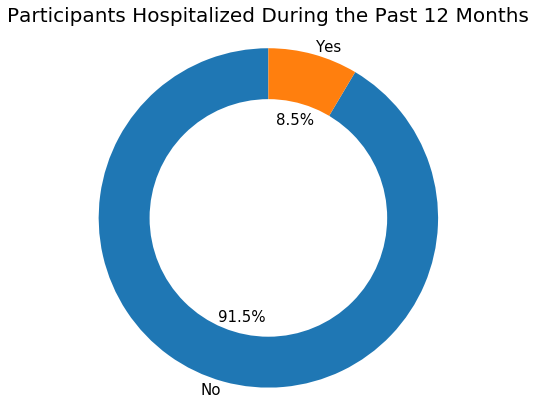

## Data Preparation

Most of the data manipulation for this project involved altering the medical conditions data to show only those conditions which patients had had for 12 months or more.  Since the target is hospitalizations within the past year, I only used medical conditions as predictors if patients were diagnosed with them prior to one year ago.  

The one exception to this rule was Chronic Obstructive Pulmonary Disease (COPD).  NHANES did not include a variable asking when the participant was diagnosed with COPD, unlike for the other medical conditions.  The only variable available asked if patients had ever had COPD.  Since COPD is an important predictor of hospitalizations, I included it in the model even though it is possible some patients did not know they had COPD prior to being hospitalized.

In a handful of cases, participants did not know how old they were when diagnosed with particular conditions, and instead of an age value, there was a dummy value in the data.  I replaced all dummy values with the median value for that column, with the result that when participants did not know their age of diagnosis, I marked them as having the condition for more than 1 year.

One quirk of NHANES data is that all ages over 80 are top-coded at 80, including ages of diagnosis.  Thus, for patients 80 and older who were also diagnosed with conditions at 80 or above, it is impossible to tell whether they had these conditions for longer than 1 year.  I decided to include these conditions as predictors even though it is not possible to tell whether participants had them before they were hospitalized.

Finally, I excluded participants younger than 2 from this analysis, because the variables I focused on were not available for these participants.

The data cleaning and engineering steps I followed can be found in [this notebook](https://github.com/lilisbeit/nhanes/blob/main/data-cleaning-and-feature_engineering.ipynb).

## Modeling

### Model Types and Metrics

I tested several model types including logistic regression, naive Bayes, random forest, gradient-boosted tree, and neural net.  I evaluated each model on its recall (sensitivity) score, while ensuring that the precision (specificity) score was not too low.  Since ACOs will need a list of specific patients to target, the goal of this project was to correctly identify as many high-risk patients as possible, with a lesser focus on excluding patients who were not hospitalized.  Since reaching high-risk patients is the primary goal, and outreach will benefit all patients, it pays to have more false positives than false negatives.  I set a minimum threshold of 0.2 for precision, meaning that the ratio of false positive to true positives cannot exceed 4:1.  

I also calculated the Receiver Operating Curve (ROC-AUC) score for reference, because the [AJMC article](https://www.ajmc.com/view/predicting-hospitalizations-from-electronic-health-record-data) referenced above used this metric to evaluate its models.  The study authors used EHR and billing data to predict which patients would be hospitalized over the next 6 months, and built a model with an ROC-AUC score of 0.846.

All scores were calculated by running five-fold cross-validation and taking the mean of each metric.

The final model is a Complement Naive Bayes model which had a recall score of 0.62, a precision score of 0.21 and an ROC-AUC score of 0.73.  In contrast, a logistic regression model using the same data had a recall score of just 
0.07, a precision score of 0.52, and a ROC-AUC score of 0.76.  This model would not be useful to an ACO because it would capture only 7% of at-risk patients.  Because hospitalized patients make up only 8.5% of all patients, correctly identifying them is difficult using many machine learning models.

In [1]:
# import libraries

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import utils as ut

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_curve, auc
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import cross_val_predict, GridSearchCV
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import ComplementNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE

from tensorflow.keras.layers import Input, Dense, LSTM, Embedding
from tensorflow.keras.layers import Dropout, Activation, Bidirectional, GlobalMaxPool1D
from tensorflow.keras.models import Sequential
from tensorflow.keras import initializers, regularizers, constraints, optimizers, layers

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.float_format', lambda x: '%.5f' % x)
pd.set_option('display.max_colwidth', 1000)

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/opt/anaconda3/envs/learn-env/lib/python

### Feature Selection for Baseline Model

In the baseline model, I included some of the medical conditions most likely to lead to hospitalization, according to the [AHRQ](https://www.hcup-us.ahrq.gov/faststats/NationalDiagnosesServlet) and the [AJMC article](https://www.ajmc.com/view/predicting-hospitalizations-from-electronic-health-record-data):


* circulatory system (in particular heart failure)
* respiratory system (in particular COPD)
* diabetes
* osteoarthritis
* age

Since there are only 9,000 rows in my data, I chose to include around 10 variables as a first pass, since more may make the model's predictions ungeneralizable due to the curse of dimensionality.

Other conditions linked to hospitalizations include:
* liver conditions (included later)
* sickle cell anemia (not in NHANES data)
* osteoporosis / hip fractures (add in a future iteration of this project)
* alcohol-related disorders (add in a future iteration of this project)
* depressive disorders (add in a future iteration of this project)

In this model, the variables are continuous, showing how many years the participant has had each medical condition
This model uses logistic regression with L2 regularization.

In [2]:
# import df with continuous variables

yrs_df_3 = pd.read_csv('data/yrs_df').set_index('SEQN')
yrs_df_3


,RIDAGEYR,yrs_osteoarth,yrs_other_arth,yrs_heart_fail,yrs_heart_cond,ever_had_COPD,yrs_emphysema,yrs_chron_bronc,yrs_asthma,yrs_diabetes,yrs_taking_ins,HUQ071
SEQN,,,,,,,,,,,,
93703.00000,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
93704.00000,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
93705.00000,66.00000,0.00000,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
93706.00000,18.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
93707.00000,13.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...
102952.00000,70.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
102953.00000,42.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
102954.00000,41.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000


In [3]:
# minority class is just 8.5 %

yrs_df_3['HUQ071'].value_counts(normalize=True)


0.00000   0.91455
1.00000   0.08545
Name: HUQ071, dtype: float64

In [4]:
# create df to plot doughnut chart

target_ratio = pd.DataFrame(yrs_df_3['HUQ071'].value_counts(normalize=True))
target_ratio.rename(index = {0.00000: 'No', 1.00000: 'Yes'}, inplace=True)
target_ratio


,HUQ071
No,0.91455
Yes,0.08545


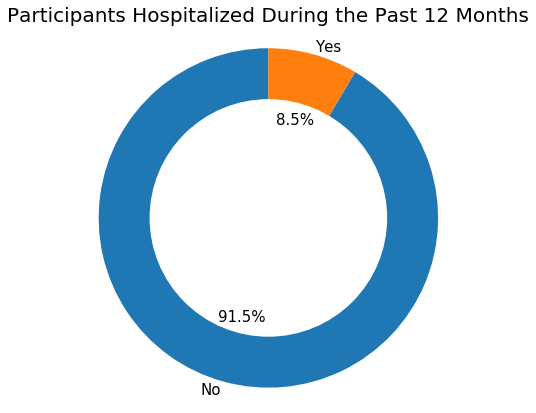

In [5]:
# plot doughnut chart to show target distribution
# minority class is very small

plt.rcParams['font.size'] = 15

fig1, ax1 = plt.subplots(figsize=(8,6))
ax1.pie(target_ratio['HUQ071'], 
        labels=target_ratio.index,
        autopct='%1.1f%%',
        labeldistance=1.05,
        startangle=90,
        textprops = {"fontsize":15})
ax1.set_title('Participants Hospitalized During the Past 12 Months', pad=10, fontsize=20)

#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.savefig('images/label-distribution-pie-1', bbox_inches='tight')


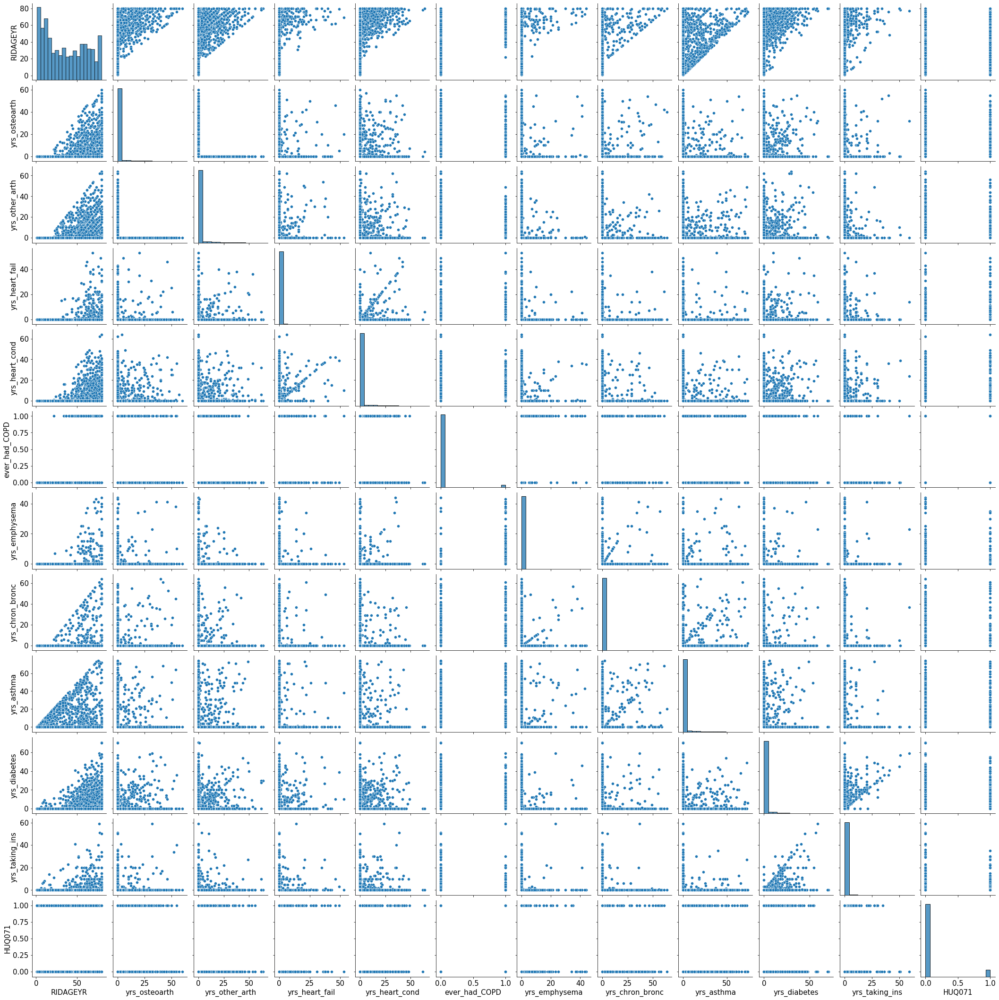

In [6]:
# check correlations between variables

sns.pairplot(yrs_df_3)


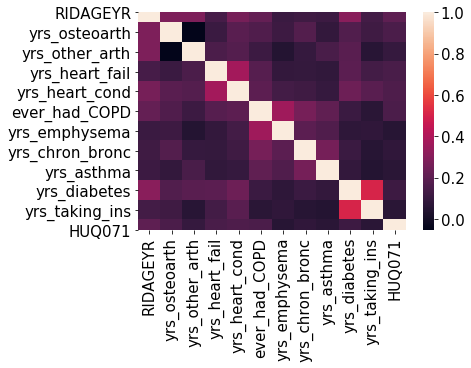

In [7]:
# check correlations with heatmap

corr = yrs_df_3.corr()
sns.heatmap(corr)

# no strong correlations
# even diabetes and taking insulin is only 50% correlated
# nothing is strongly correlated with hospitalization (HUQ071)


### Baseline Model: Logistic regression using continuous variables

In [8]:
# define X and y

X = yrs_df_3.drop(columns = ['HUQ071'])
y = yrs_df_3['HUQ071']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)


Classifier: LogisticRegression(max_iter=10000)
Cross-validation folds: 5


Mean ROC-AUC Score: 0.719


Train mean recall: 0.03 +/- 0.01
Train mean precision: 0.59 +/- 0.07
Train mean F1: 0.06 +/- 0.02


Test mean recall: 0.02 +/- 0.01
Test mean precision: 0.45 +/- 0.18
Test mean F1: 0.05 +/- 0.02


Feature weights: 
                   weight  abs_weight
RIDAGEYR         1.67940     1.67940
yrs_heart_fail   1.61490     1.61490
yrs_heart_cond   1.60670     1.60670
yrs_osteoarth    1.48310     1.48310
yrs_other_arth   0.98410     0.98410
ever_had_COPD    0.71110     0.71110
yrs_taking_ins   0.66050     0.66050
yrs_chron_bronc  0.21340     0.21340
yrs_emphysema   -0.10480     0.10480
yrs_asthma       0.08680     0.08680
yrs_diabetes     0.06540     0.06540 

Confusion matrices for each fold test set: 



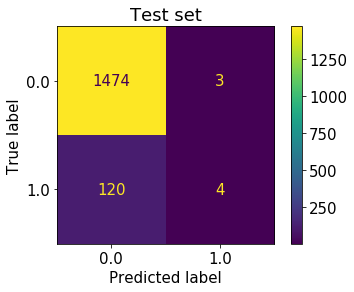

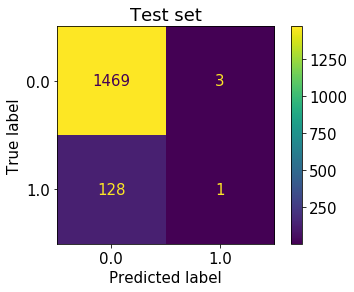

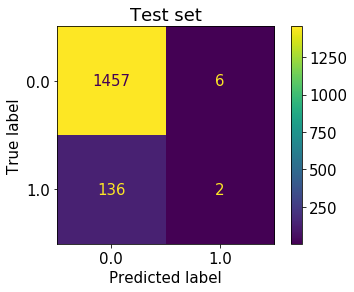

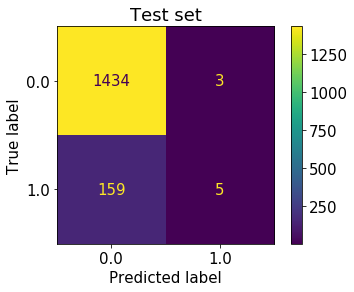

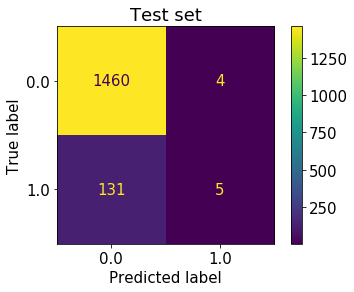

In [9]:
# instantiate and evaluate logistic regression model

logreg = LogisticRegression(max_iter=10000)

ut.k_fold_validator(X=X_training, y=y_training, classifier=logreg, cv=5)


### Model 2: Logistic regression using continuous variables and balanced class weights

Classifier: LogisticRegression(class_weight='balanced', max_iter=10000)
Cross-validation folds: 5


Mean ROC-AUC Score: 0.719


Train mean recall: 0.62 +/- 0.01
Train mean precision: 0.16 +/- 0.01
Train mean F1: 0.25 +/- 0.01


Test mean recall: 0.62 +/- 0.04
Test mean precision: 0.16 +/- 0.02
Test mean F1: 0.25 +/- 0.03


Feature weights: 
                  weight  abs_weight
yrs_heart_cond  2.04340     2.04340
yrs_heart_fail  1.97430     1.97430
yrs_osteoarth   1.88470     1.88470
RIDAGEYR        1.60610     1.60610
yrs_other_arth  1.08130     1.08130
yrs_taking_ins  0.83050     0.83050
ever_had_COPD   0.70650     0.70650
yrs_chron_bronc 0.29250     0.29250
yrs_diabetes    0.15130     0.15130
yrs_asthma      0.09120     0.09120
yrs_emphysema   0.01730     0.01730 

Confusion matrices for each fold test set: 



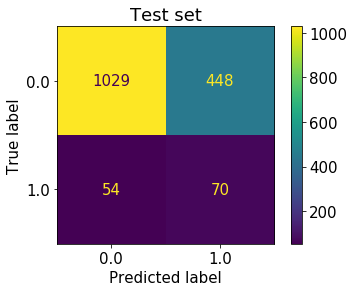

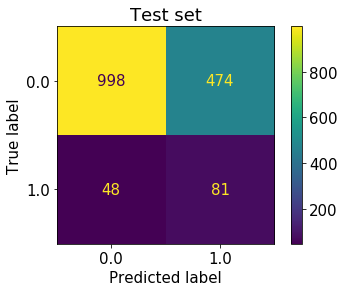

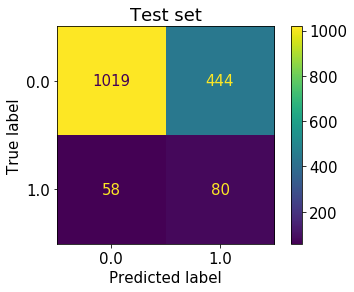

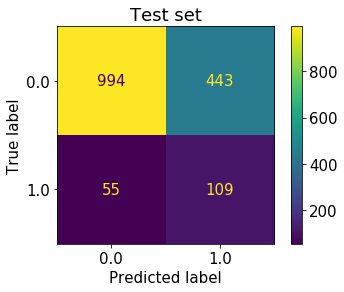

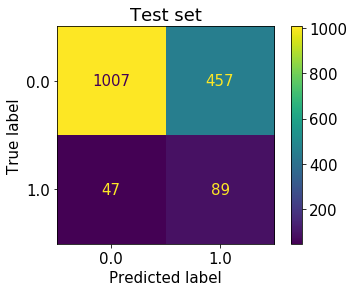

In [10]:
# instantiate and evaluate logistic regression model with balanced class weight

logreg = LogisticRegression(max_iter=10000, class_weight='balanced')

ut.k_fold_validator(X=X_training, y=y_training, classifier=logreg, cv=5)

### Model 3: Complement Naive Bayes model with continuous variables

Classifier: ComplementNB()
Cross-validation folds: 5


Mean ROC-AUC Score: 0.55


Train mean recall: 0.3 +/- 0.01
Train mean precision: 0.28 +/- 0.0
Train mean F1: 0.29 +/- 0.01


Test mean recall: 0.3 +/- 0.01
Test mean precision: 0.27 +/- 0.02
Test mean F1: 0.28 +/- 0.01


Feature weights: 
                  weight  abs_weight
yrs_emphysema   5.41350     5.41350
yrs_heart_fail  5.38400     5.38400
yrs_taking_ins  4.96720     4.96720
yrs_chron_bronc 4.68530     4.68530
yrs_heart_cond  3.95170     3.95170
yrs_osteoarth   3.58130     3.58130
yrs_diabetes    3.49430     3.49430
yrs_other_arth  3.48160     3.48160
yrs_asthma      3.29190     3.29190
ever_had_COPD   3.06700     3.06700
RIDAGEYR        0.24480     0.24480 

Confusion matrices for each fold test set: 



/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute coef_ was deprecated in version 0.24 and will be removed in 1.1 (renaming of 0.26).
  warnings.warn(msg, category=FutureWarning)


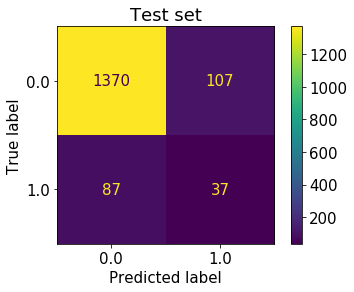

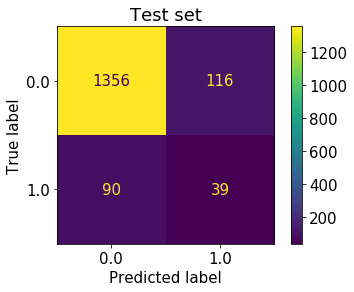

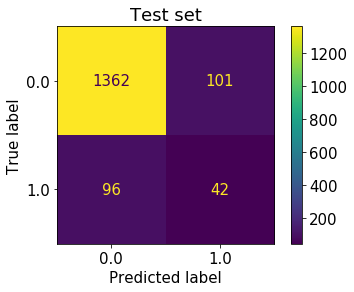

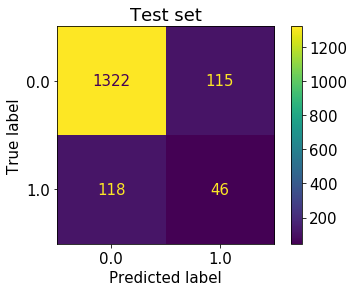

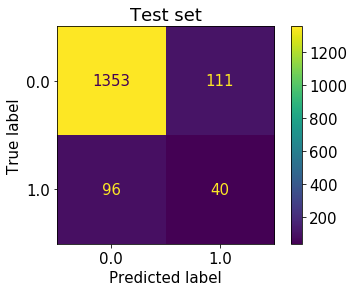

In [11]:
# try a complement Naive Bayes

CompNB = ComplementNB()

ut.k_fold_validator(X_training, y_training, CompNB)

### Model 3: Decision Tree with Continuous Variables

Classifier: DecisionTreeClassifier(min_samples_split=3)
Cross-validation folds: 5


Mean ROC-AUC Score: 0.499


Train mean recall: 0.47 +/- 0.01
Train mean precision: 1.0 +/- 0.0
Train mean F1: 0.64 +/- 0.01


Test mean recall: 0.12 +/- 0.02
Test mean precision: 0.23 +/- 0.04
Test mean F1: 0.15 +/- 0.03


Feature weights: 
                  weight  abs_weight
RIDAGEYR        0.28920     0.28920
yrs_heart_cond  0.15250     0.15250
yrs_diabetes    0.11200     0.11200
yrs_osteoarth   0.11140     0.11140
yrs_other_arth  0.10790     0.10790
yrs_asthma      0.07040     0.07040
yrs_heart_fail  0.05790     0.05790
yrs_taking_ins  0.04280     0.04280
yrs_chron_bronc 0.02920     0.02920
yrs_emphysema   0.01700     0.01700
ever_had_COPD   0.00980     0.00980 

Confusion matrices for each fold test set: 



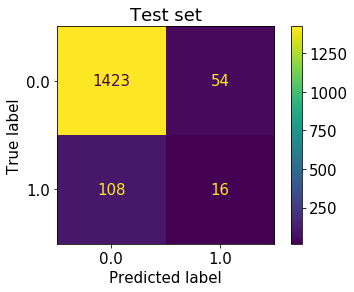

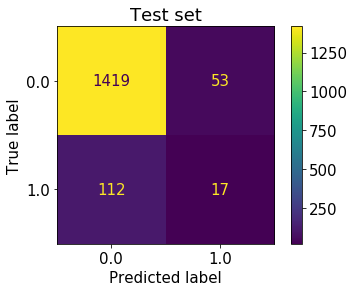

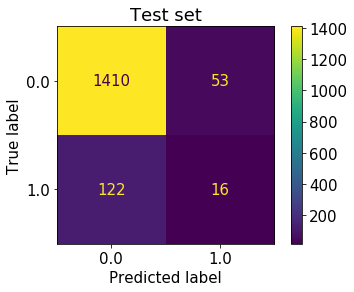

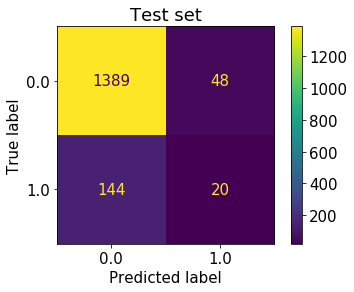

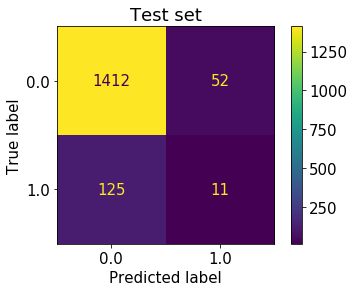

In [22]:
# try a decision tree

tree = DecisionTreeClassifier(min_samples_split=3)

ut.k_fold_validator(X_training, y_training, tree)

### Model 4: Pruned Decision Tree with Grid Search Parameters and Continuous Variables

Classifier: GridSearchCV(cv=3, estimator=DecisionTreeClassifier(min_samples_split=3),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 4, 6, 8],
                         'max_features': [10, 13, 16],
                         'min_samples_leaf': [10, 12, 14],
                         'min_samples_split': [8, 10, 12]})
Cross-validation folds: 5




/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

Mean ROC-AUC Score: 0.713


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 



Train mean recall: 0.06 +/- 0.01
Train mean precision: 0.61 +/- 0.06
Train mean F1: 0.12 +/- 0.02


Test mean recall: 0.05 +/- 0.02
Test mean precision: 0.45 +/- 0.09
Test mean F1: 0.09 +/- 0.03




AttributeError: 'GridSearchCV' object has no attribute 'coef_'

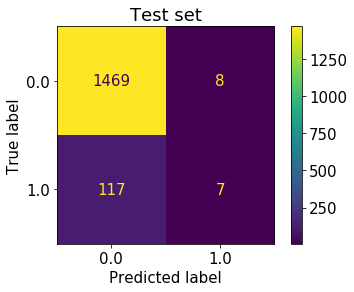

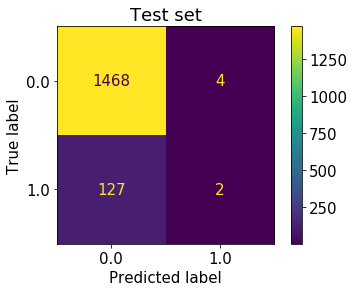

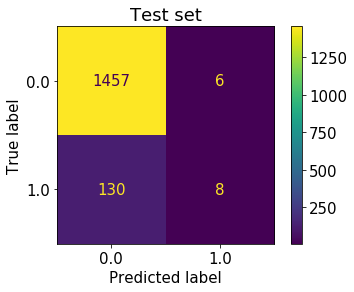

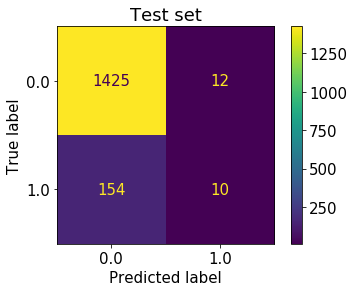

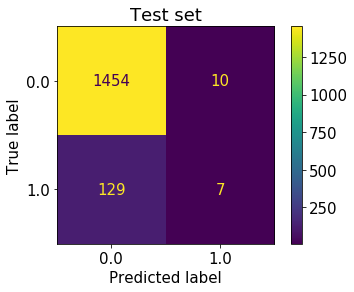

In [23]:
tree_param_grid = {'criterion': ['gini', 'entropy'],
                 'max_depth': [None, 4, 6, 8],
                 'min_samples_leaf': [10, 12, 14],
                 'min_samples_split': [8, 10, 12],
                  'max_features': [10, 13, 16]}
                 
tree_grid_search = GridSearchCV(tree, tree_param_grid, cv=3)

ut.k_fold_validator(X_training, y_training, tree_grid_search)

In [24]:
tree_grid_search.best_params_

{'criterion': 'gini',
 'max_depth': 4,
 'max_features': 10,
 'min_samples_leaf': 14,
 'min_samples_split': 10}

In [25]:
tree_grid_search.best_estimator_.feature_importances_

array([0.29418332, 0.05376404, 0.        , 0.11737276, 0.51662161,
       0.        , 0.        , 0.01805827, 0.        , 0.        ,
       0.        ])

Classifier: GridSearchCV(cv=3, estimator=DecisionTreeClassifier(min_samples_split=3),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 4, 6, 8],
                         'max_features': [10, 13, 16],
                         'min_samples_leaf': [10, 12, 14],
                         'min_samples_split': [8, 10, 12]},
             scoring='recall')
Cross-validation folds: 2




/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

Mean ROC-AUC Score: 0.644


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 902, in fit
    X_idx_sorted=X_idx_sorted)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/tree/_classes.py", line 288, in fit
    raise ValueError("max_features must be in (0, n_features]")
ValueError: max_features must be in (0, n_features]

  FitFailedWarning)
/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this 



Train mean recall: 0.15 +/- 0.02
Train mean precision: 0.66 +/- 0.03
Train mean F1: 0.24 +/- 0.02


Test mean recall: 0.07 +/- 0.03
Test mean precision: 0.29 +/- 0.03
Test mean F1: 0.11 +/- 0.04




AttributeError: 'GridSearchCV' object has no attribute 'coef_'

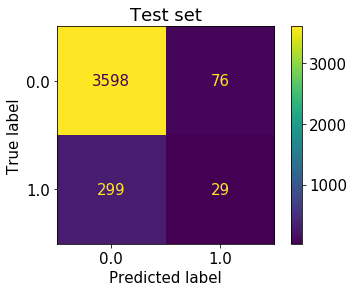

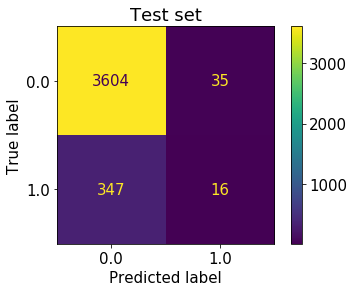

In [27]:
tree_grid_search = GridSearchCV(tree, tree_param_grid, cv=3, scoring='recall')

ut.k_fold_validator(X_training, y_training, tree_grid_search, cv=2)

In [28]:
tree_grid_search.best_params_

{'criterion': 'gini',
 'max_depth': None,
 'max_features': 10,
 'min_samples_leaf': 10,
 'min_samples_split': 8}

In [29]:
# class_weight= try this

forest = RandomForestClassifier(n_estimators=100, criterion='gini', max_features=10,
                                min_samples_leaf=10, min_samples_split=8)
forest.fit(X_training, y_training)

RandomForestClassifier(max_features=10, min_samples_leaf=10,
                       min_samples_split=8)

Classifier: RandomForestClassifier(max_features=10, min_samples_leaf=10,
                       min_samples_split=8)
Cross-validation folds: 2


Mean ROC-AUC Score: 0.724


Train mean recall: 0.05 +/- 0.01
Train mean precision: 0.9 +/- 0.03
Train mean F1: 0.1 +/- 0.02


Test mean recall: 0.02 +/- 0.0
Test mean precision: 0.47 +/- 0.1
Test mean F1: 0.03 +/- 0.0




AttributeError: 'RandomForestClassifier' object has no attribute 'coef_'

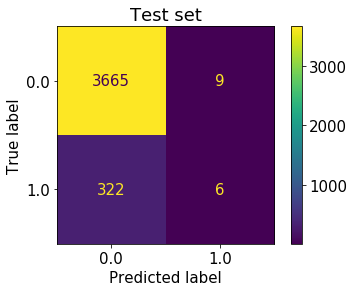

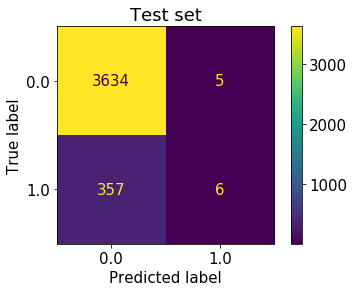

In [31]:
ut.k_fold_validator(X_training, y_training, forest, cv=2)

In [32]:
oversample = SMOTE()
X_smote, y_smote = oversample.fit_resample(X_training, y_training)

Classifier: ComplementNB()
Cross-validation folds: 5


Mean ROC-AUC Score: 0.558


Train mean recall: 0.32 +/- 0.0
Train mean precision: 0.8 +/- 0.0
Train mean F1: 0.46 +/- 0.0


Test mean recall: 0.32 +/- 0.01
Test mean precision: 0.8 +/- 0.01
Test mean F1: 0.46 +/- 0.01


Feature weights: 
                  weight  abs_weight
yrs_heart_fail  5.40170     5.40170
yrs_emphysema   5.25780     5.25780
yrs_taking_ins  4.89490     4.89490
yrs_chron_bronc 4.70130     4.70130
yrs_heart_cond  3.96580     3.96580
yrs_osteoarth   3.60360     3.60360
yrs_diabetes    3.52880     3.52880
yrs_other_arth  3.47380     3.47380
yrs_asthma      3.27560     3.27560
ever_had_COPD   3.08300     3.08300
RIDAGEYR        0.24390     0.24390 

Confusion matrices for each fold test set: 



/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute coef_ was deprecated in version 0.24 and will be removed in 1.1 (renaming of 0.26).
  warnings.warn(msg, category=FutureWarning)


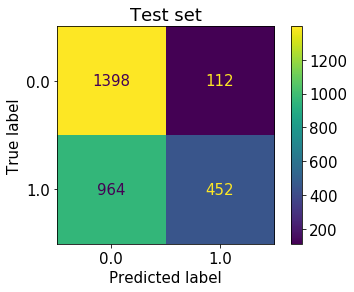

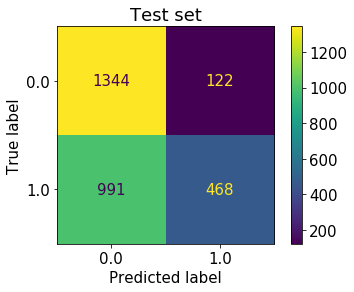

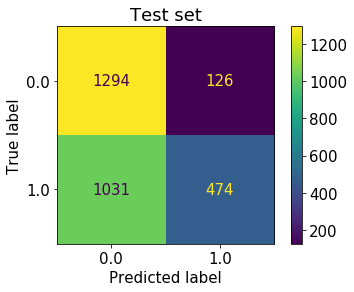

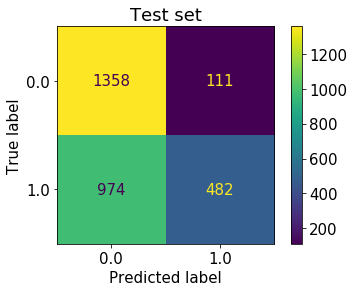

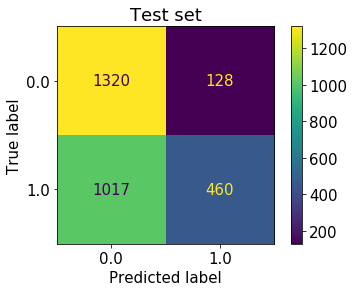

In [34]:
CompNB = ComplementNB()

ut.k_fold_validator(X_smote, y_smote, CompNB)

# smote does not help recall

Classifier: RandomForestClassifier(max_features=10, min_samples_leaf=10,
                       min_samples_split=8)
Cross-validation folds: 5


Mean ROC-AUC Score: 0.881


Train mean recall: 0.78 +/- 0.01
Train mean precision: 0.85 +/- 0.01
Train mean F1: 0.81 +/- 0.0


Test mean recall: 0.75 +/- 0.02
Test mean precision: 0.81 +/- 0.01
Test mean F1: 0.78 +/- 0.01




AttributeError: 'RandomForestClassifier' object has no attribute 'coef_'

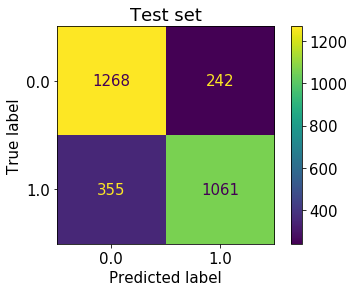

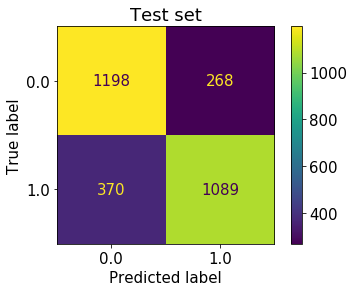

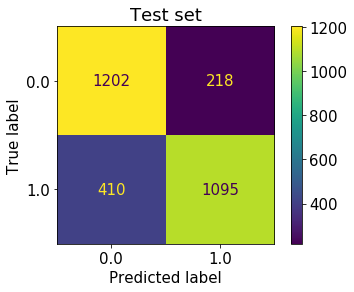

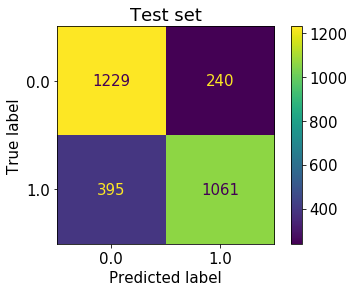

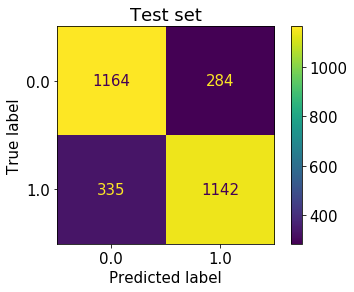

In [35]:
ut.k_fold_validator(X_smote, y_smote, forest)

# smote does help recall

In [36]:
forest.fit(X_smote, y_smote)

y_pred = forest.predict(X_holdout)

In [37]:
y_pred

array([0., 0., 0., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0.

In [38]:
print(recall_score(y_holdout, y_pred),
precision_score(y_holdout, y_pred),
      accuracy_score(y_holdout, y_pred))

0.3188405797101449 0.171875 0.8280898876404494


In [ ]:
# try imblearn

In [39]:
binary_df = pd.read_csv('data/binary_df').set_index('SEQN')

In [40]:
# minority class is  8.5%, as above

binary_df['HUQ071'].value_counts(normalize=True)

0.00000   0.91455
1.00000   0.08545
Name: HUQ071, dtype: float64

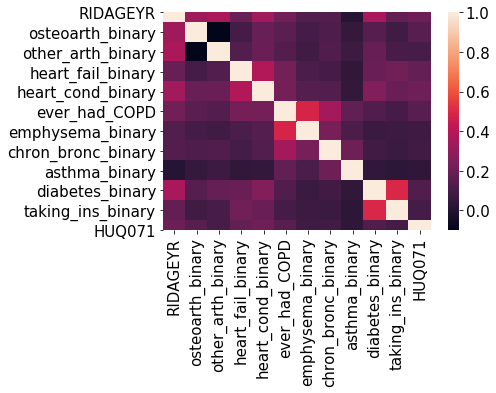

In [41]:
corr = binary_df.corr()
sns.heatmap(corr)

# no strong correlations
# even diabetes and taking insulin is only 50% correlated
# nothing is strongly correlated with hospitalization (HUQ071)

In [42]:
# define X and y

X = binary_df.drop(columns = 'HUQ071')
y = binary_df['HUQ071']

In [43]:
# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

Classifier: ComplementNB()
Cross-validation folds: 5


Mean ROC-AUC Score: 0.604


Train mean recall: 0.41 +/- 0.02
Train mean precision: 0.26 +/- 0.02
Train mean F1: 0.32 +/- 0.01


Test mean recall: 0.41 +/- 0.05
Test mean precision: 0.26 +/- 0.03
Test mean F1: 0.32 +/- 0.03


Feature weights: 
                     weight  abs_weight
emphysema_binary   4.66390     4.66390
heart_fail_binary  4.21200     4.21200
chron_bronc_binary 4.05590     4.05590
taking_ins_binary  3.69590     3.69590
ever_had_COPD      3.56530     3.56530
heart_cond_binary  2.81920     2.81920
osteoarth_binary   2.62620     2.62620
asthma_binary      2.36340     2.36340
diabetes_binary    2.33120     2.33120
other_arth_binary  2.24040     2.24040
RIDAGEYR           0.74310     0.74310 

Confusion matrices for each fold test set: 



/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute coef_ was deprecated in version 0.24 and will be removed in 1.1 (renaming of 0.26).
  warnings.warn(msg, category=FutureWarning)


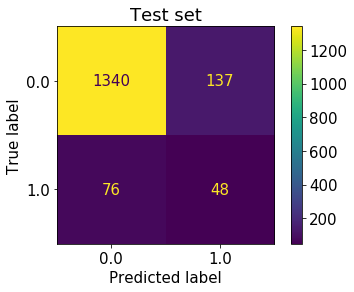

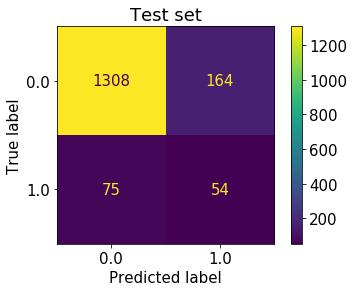

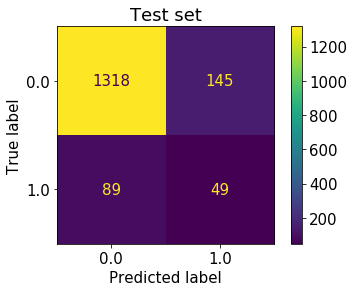

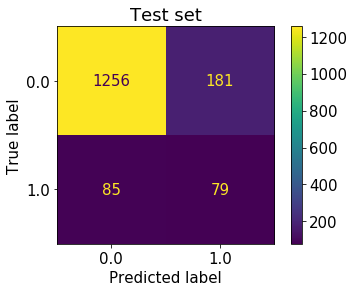

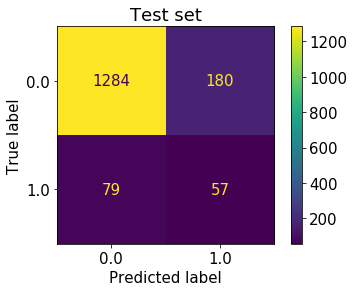

In [45]:
# try a complement naive Bayes

CompNB = ComplementNB()

ut.k_fold_validator(X_training, y_training, CompNB)

Classifier: LogisticRegression()
Cross-validation folds: 5


Mean ROC-AUC Score: 0.729


Train mean recall: 0.05 +/- 0.01
Train mean precision: 0.53 +/- 0.04
Train mean F1: 0.09 +/- 0.01


Test mean recall: 0.05 +/- 0.01
Test mean precision: 0.5 +/- 0.12
Test mean F1: 0.09 +/- 0.02


Feature weights: 
                     weight  abs_weight
RIDAGEYR           1.28300     1.28300
heart_fail_binary  0.84880     0.84880
heart_cond_binary  0.76470     0.76470
osteoarth_binary   0.74130     0.74130
ever_had_COPD      0.47160     0.47160
other_arth_binary  0.33810     0.33810
taking_ins_binary  0.24740     0.24740
asthma_binary      0.10540     0.10540
chron_bronc_binary 0.08960     0.08960
diabetes_binary    0.08380     0.08380
emphysema_binary   0.04380     0.04380 

Confusion matrices for each fold test set: 



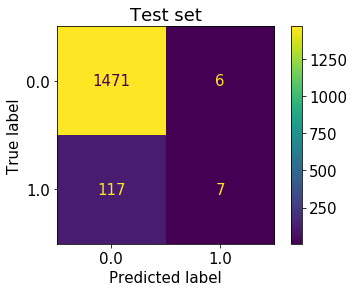

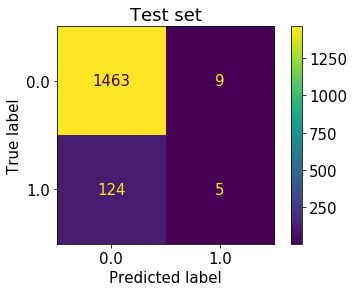

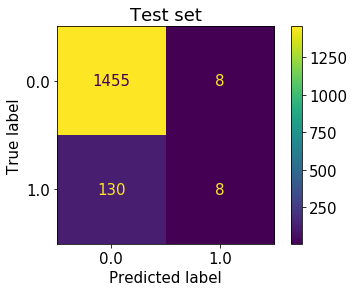

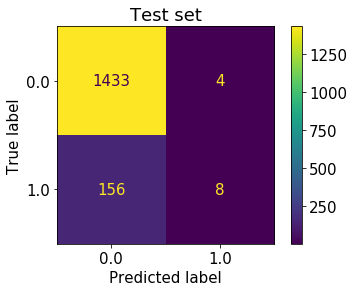

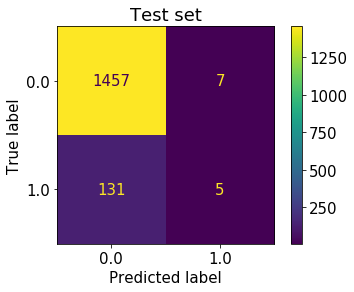

In [47]:
# try a Logistic Regression

logreg = LogisticRegression()

ut.k_fold_validator(X_training, y_training, logreg)

Classifier: LogisticRegression(class_weight='balanced')
Cross-validation folds: 5


Mean ROC-AUC Score: 0.729


Train mean recall: 0.61 +/- 0.01
Train mean precision: 0.19 +/- 0.01
Train mean F1: 0.29 +/- 0.01


Test mean recall: 0.6 +/- 0.02
Test mean precision: 0.18 +/- 0.02
Test mean F1: 0.28 +/- 0.03


Feature weights: 
                     weight  abs_weight
RIDAGEYR           1.26170     1.26170
heart_cond_binary  0.89160     0.89160
heart_fail_binary  0.86460     0.86460
osteoarth_binary   0.75930     0.75930
ever_had_COPD      0.53660     0.53660
other_arth_binary  0.32840     0.32840
asthma_binary      0.18080     0.18080
emphysema_binary   0.14910     0.14910
diabetes_binary    0.14540     0.14540
chron_bronc_binary 0.12450     0.12450
taking_ins_binary  0.12410     0.12410 

Confusion matrices for each fold test set: 



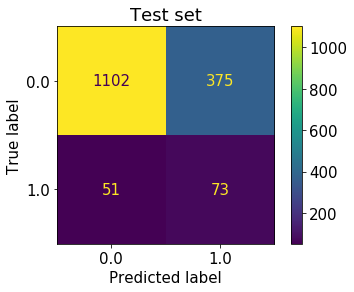

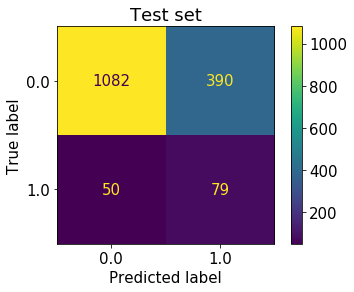

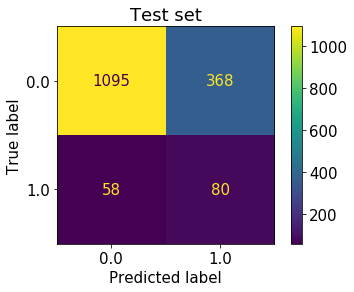

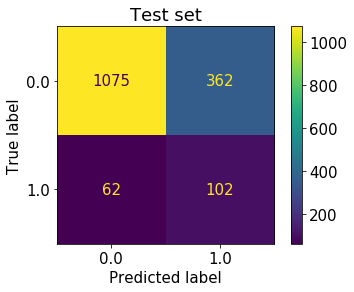

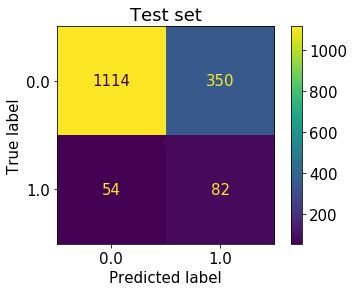

In [48]:
# try a Logistic Regression with balanced class weight

logreg = LogisticRegression(class_weight='balanced')

ut.k_fold_validator(X_training, y_training, logreg)

Classifier: DecisionTreeClassifier(max_depth=6, min_samples_split=15)
Cross-validation folds: 5


Mean ROC-AUC Score: 0.699


Train mean recall: 0.08 +/- 0.01
Train mean precision: 0.73 +/- 0.02
Train mean F1: 0.14 +/- 0.02


Test mean recall: 0.05 +/- 0.01
Test mean precision: 0.43 +/- 0.1
Test mean F1: 0.09 +/- 0.02


Feature weights: 
                     weight  abs_weight
heart_cond_binary  0.36620     0.36620
RIDAGEYR           0.33790     0.33790
heart_fail_binary  0.08070     0.08070
diabetes_binary    0.07930     0.07930
osteoarth_binary   0.03640     0.03640
ever_had_COPD      0.03450     0.03450
emphysema_binary   0.01660     0.01660
asthma_binary      0.01630     0.01630
taking_ins_binary  0.01230     0.01230
chron_bronc_binary 0.01040     0.01040
other_arth_binary  0.00950     0.00950 

Confusion matrices for each fold test set: 



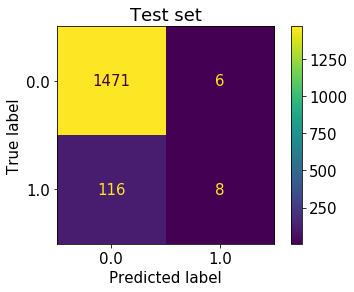

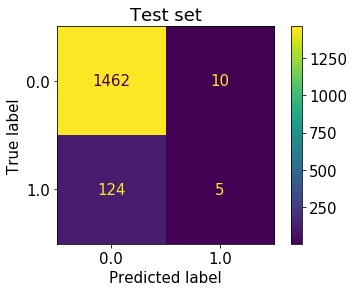

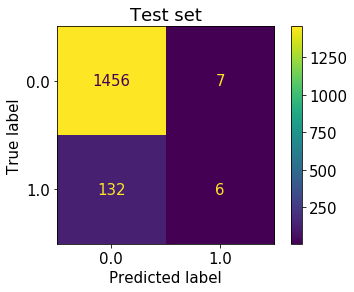

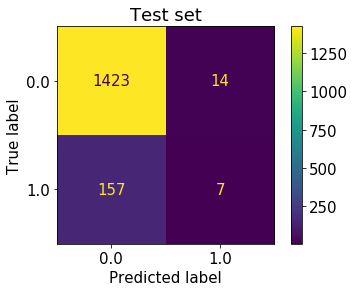

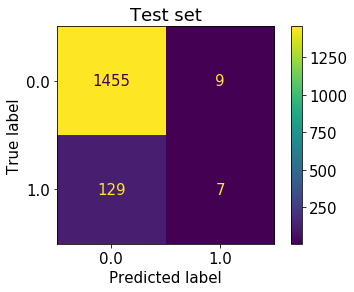

In [49]:
# try a decision tree

tree = DecisionTreeClassifier(max_depth=6, min_samples_split=15)

ut.k_fold_validator(X_training, y_training, tree)

Classifier: KNeighborsClassifier()
Cross-validation folds: 5


Mean ROC-AUC Score: 0.622


Train mean recall: 0.11 +/- 0.01
Train mean precision: 0.65 +/- 0.07
Train mean F1: 0.19 +/- 0.02


Test mean recall: 0.04 +/- 0.02
Test mean precision: 0.22 +/- 0.05
Test mean F1: 0.06 +/- 0.03




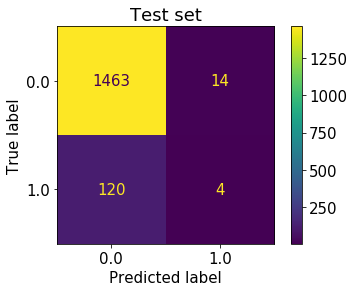

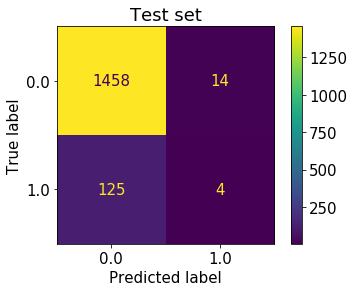

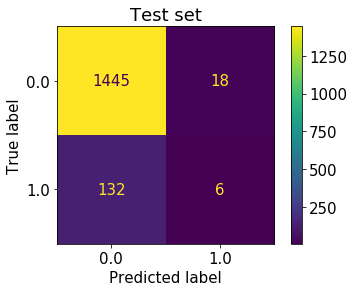

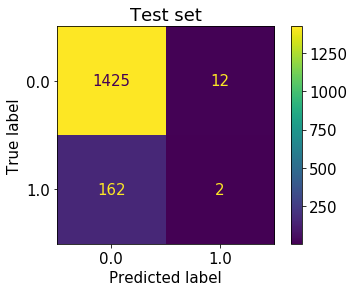

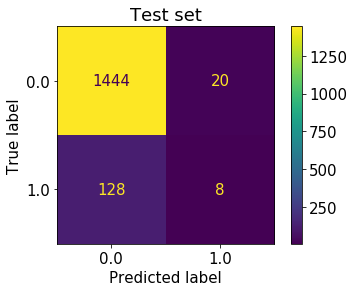

In [12]:
knn = KNeighborsClassifier()

ut.k_fold_validator(X_training, y_training, knn)


Classifier: KNeighborsClassifier(n_neighbors=3)
Cross-validation folds: 5


Mean ROC-AUC Score: 0.584


Train mean recall: 0.23 +/- 0.02
Train mean precision: 0.64 +/- 0.12
Train mean F1: 0.33 +/- 0.02


Test mean recall: 0.07 +/- 0.03
Test mean precision: 0.23 +/- 0.06
Test mean F1: 0.11 +/- 0.04




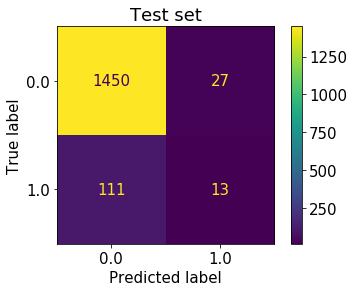

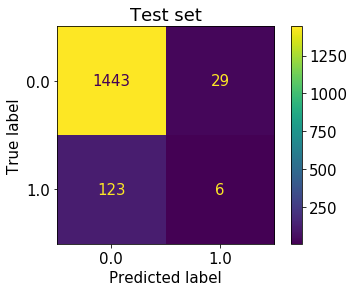

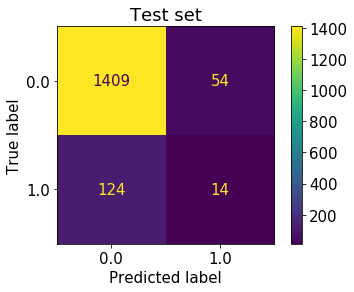

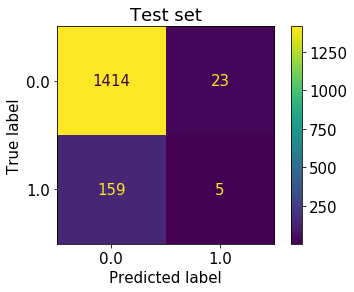

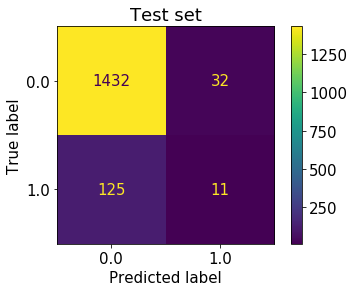

In [13]:
# try set weights equal to relative

knn = KNeighborsClassifier(n_neighbors=3)

ut.k_fold_validator(X_training, y_training, knn)

# very slight improvement in test

In [14]:
knn_param_grid = {'n_neighbors': [3, 5, 7],
                 'weights': ['uniform', 'distance'],
                 'leaf_size': [20, 30, 40]}

Classifier: GridSearchCV(cv=3, estimator=KNeighborsClassifier(n_neighbors=3),
             param_grid={'leaf_size': [20, 30, 40], 'n_neighbors': [3, 5, 7],
                         'weights': ['uniform', 'distance']})
Cross-validation folds: 2


Mean ROC-AUC Score: 0.629


Train mean recall: 0.04 +/- 0.02
Train mean precision: 0.55 +/- 0.04
Train mean F1: 0.08 +/- 0.03


Test mean recall: 0.01 +/- 0.0
Test mean precision: 0.21 +/- 0.0
Test mean F1: 0.03 +/- 0.0




AttributeError: 'GridSearchCV' object has no attribute 'coef_'

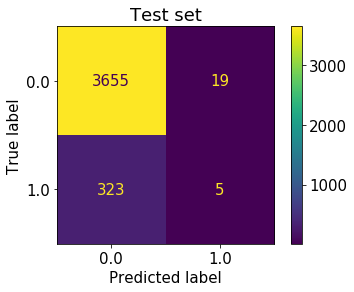

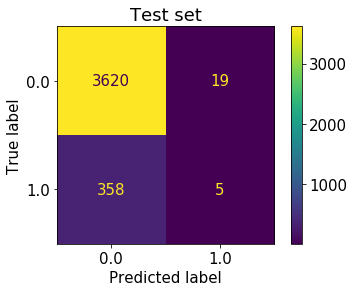

In [15]:
knn_grid_search = GridSearchCV(knn, knn_param_grid, cv=3)

ut.k_fold_validator(X_training, y_training, knn_grid_search, cv=2)

Classifier: GridSearchCV(cv=3, estimator=KNeighborsClassifier(n_neighbors=3),
             param_grid={'leaf_size': [20, 30, 40], 'n_neighbors': [3, 5, 7],
                         'weights': ['uniform', 'distance']},
             scoring='recall')
Cross-validation folds: 2


Mean ROC-AUC Score: 0.582


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_scorer.py", line 243, in _score
    **self._kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/metrics/_classification.py", line 1777, in recall_score
    zero_



Train mean recall: 0.23 +/- 0.03
Train mean precision: 0.73 +/- 0.04
Train mean F1: 0.35 +/- 0.04


Test mean recall: 0.05 +/- 0.01
Test mean precision: 0.21 +/- 0.07
Test mean F1: 0.08 +/- 0.02




AttributeError: 'GridSearchCV' object has no attribute 'coef_'

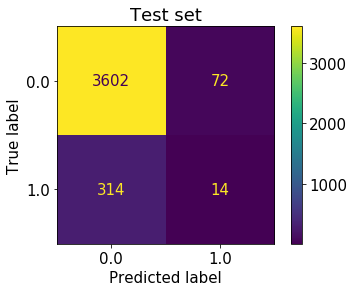

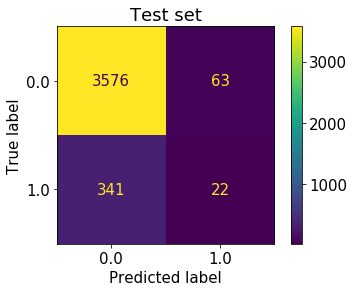

In [16]:
knn_grid_search = GridSearchCV(knn, knn_param_grid, cv=3, scoring='recall')

ut.k_fold_validator(X_training, y_training, knn_grid_search, cv=2)

In [17]:
nn = Sequential()

# Input layer with dropout
nn.add(layers.Dropout(0.3))

# First hidden layer
nn.add(layers.Dense(10, activation='relu'))
nn.add(layers.Dropout(0.3))

# Second hidden layer
nn.add(layers.Dense(10, activation='relu'))
nn.add(layers.Dropout(0.3))

# Third hidden layer
nn.add(layers.Dense(10, activation='relu'))
nn.add(layers.Dropout(0.3))

# Output layer
nn.add(layers.Dense(1, activation='linear'))

# Compile the model
nn.compile(optimizer='SGD', 
              loss='mse',  
              metrics=['accuracy']) 

# Return the compiled model


In [18]:
y_training_array = y_training.to_numpy().reshape((8004,1))

In [19]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_training)
X_train_scaled = pd.DataFrame(X_train_scaled, index=X_training.index, columns=X_training.columns)

In [20]:
X_train_scaled_reindex = X_train_scaled.reset_index(drop=True)
X_train_scaled_reindex

,RIDAGEYR,yrs_osteoarth,yrs_other_arth,yrs_heart_fail,yrs_heart_cond,ever_had_COPD,yrs_emphysema,yrs_chron_bronc,yrs_asthma,yrs_diabetes,yrs_taking_ins
0,0.60293,-0.21899,-0.24289,-0.10494,-0.19898,-0.18177,-0.07961,-0.10946,-0.22644,-0.24608,-0.11137
1,0.24374,-0.21899,-0.24289,-0.10494,-0.19898,-0.18177,-0.07961,-0.10946,-0.22644,-0.24608,-0.11137
2,-0.11544,-0.21899,-0.24289,-0.10494,-0.19898,-0.18177,-0.07961,-0.10946,-0.22644,-0.24608,-0.11137
3,-1.35263,-0.21899,-0.24289,-0.10494,-0.19898,-0.18177,-0.07961,-0.10946,-0.22644,-0.24608,-0.11137
4,-0.15535,-0.21899,-0.24289,-0.10494,-0.19898,-0.18177,-0.07961,-0.10946,-0.22644,-0.24608,-0.11137
...,...,...,...,...,...,...,...,...,...,...,...
7999,-1.15308,-0.21899,-0.24289,-0.10494,-0.19898,-0.18177,-0.07961,-0.10946,-0.22644,-0.24608,-0.11137
8000,0.40338,-0.21899,1.33608,-0.10494,-0.19898,-0.18177,-0.07961,-0.10946,-0.22644,-0.24608,-0.11137
8001,-1.19299,-0.21899,-0.24289,-0.10494,-0.19898,-0.18177,-0.07961,-0.10946,-0.22644,-0.24608,-0.11137
8002,-1.07326,-0.21899,-0.24289,-0.10494,-0.19898,-0.18177,-0.07961,-0.10946,-0.22644,-0.24608,-0.11137


In [21]:
# always predicting majority class, not learning anything

nn.fit(X_train_scaled_reindex, y_training_array, epochs=10, validation_split=0.1)

Epoch 1/10
226/226 [==============================] - 1s 2ms/step - loss: 0.4213 - accuracy: 0.8994 - val_loss: 0.0804 - val_accuracy: 0.9089
Epoch 2/10
226/226 [==============================] - 0s 1ms/step - loss: 0.0926 - accuracy: 0.9128 - val_loss: 0.0800 - val_accuracy: 0.9089
Epoch 3/10
226/226 [==============================] - 0s 1ms/step - loss: 0.0891 - accuracy: 0.9062 - val_loss: 0.0810 - val_accuracy: 0.9089
Epoch 4/10
226/226 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9154 - val_loss: 0.0806 - val_accuracy: 0.9089
Epoch 5/10
226/226 [==============================] - 0s 1ms/step - loss: 0.0789 - accuracy: 0.9132 - val_loss: 0.0805 - val_accuracy: 0.9089
Epoch 6/10
226/226 [==============================] - 0s 1ms/step - loss: 0.0819 - accuracy: 0.9107 - val_loss: 0.0810 - val_accuracy: 0.9089
Epoch 7/10
226/226 [==============================] - 0s 1ms/step - loss: 0.0755 - accuracy: 0.9164 - val_loss: 0.0821 - val_accuracy: 0.9089
Epoch 

In [ ]:
# try with updated non-birth hospitalizations

binary_df_2 = pd.read_csv('data/binary_df_2').set_index('SEQN')
binary_df_2

In [ ]:
# define X and y

X = binary_df_2.drop(columns = 'updated_hosp')
y = binary_df_2['updated_hosp']

In [ ]:
# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

In [ ]:
# try a complement naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

In [ ]:
# try a Logistic Regression

logreg = LogisticRegression()

k_fold_validator_2(X_training, y_training, logreg)

In [ ]:
# try a decision tree
# tried to prune tree without success

tree = DecisionTreeClassifier(max_depth=6, min_samples_split=15)

k_fold_validator_2(X_training, y_training, tree)

In [ ]:
# add race

binary_df_3 = pd.read_csv('data/binary_df_3').set_index('SEQN')
binary_df_3.head(200)

In [ ]:
# define X and y

X = binary_df_3.drop(columns = 'updated_hosp')
y = binary_df_3['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)


In [ ]:
CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

In [ ]:
# add number of prescriptions per patient

binary_df_4 = pd.read_csv('data/binary_df_4').set_index('SEQN')
binary_df_4.head(200)

In [ ]:
# define X and y

X = binary_df_4.drop(columns = ['updated_hosp'])
y = binary_df_4['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)



In [ ]:
# try Complement Naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

In [ ]:
# drop features with lowest weights

# define X and y

X = binary_df_4.drop(columns = ['updated_hosp','RIDRETH3_3.0','RIDAGEYR'])
y = binary_df_4['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

k_fold_validator_2(X_training, y_training, CompNB)

In [ ]:
binary_df_5 = pd.read_csv('data/binary_df_5').set_index('SEQN')
binary_df_5

In [ ]:
# define X and y

X = binary_df_5.drop(columns = ['updated_hosp'])
y = binary_df_5['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)



In [ ]:
# drop features with lowest weights

# define X and y

X = binary_df_5.drop(columns = ['updated_hosp','RIDRETH3_3.0','RIDAGEYR'])
y = binary_df_5['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

k_fold_validator_2(X_training, y_training, CompNB)

In [ ]:
# try age buckets instead of continuous age

binary_df_6 = pd.read_csv('data/binary_df_6').set_index('SEQN')
binary_df_6

In [ ]:
# define X and y

X = binary_df_6.drop(columns = ['updated_hosp'])
y = binary_df_6['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)


In [ ]:
# try Complement Naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

In [ ]:
# drop feature with lowest weight

# define X and y

X = binary_df_6.drop(columns = ['updated_hosp', 'age_18-49'])
y = binary_df_6['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)


In [ ]:
# try Complement Naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

# no improvement

In [ ]:
# add feature for current liver condition

binary_df_7 = pd.read_csv('data/binary_df_7').set_index('SEQN')
binary_df_7

In [ ]:
corr = binary_df_7.corr()

plt.figure(figsize = (12,10))
sns.heatmap(corr)

# number of rx is correlated with lots of conditions, but not more than 50%
# COPD and emphysema correlated about 50%

In [ ]:
# define X and y

X = binary_df_7.drop(columns = ['updated_hosp'])
y = binary_df_7['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

# try Complement Naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

# no improvement

In [ ]:
# check how many ppl have current liver condition
binary_df_7['liver_binary'].value_counts()

# very few, but because it has a heavy weight, let's keep it in for now

In [ ]:
# try dropping column with lowest weight

X = binary_df_7.drop(columns = ['updated_hosp', 'age_18-49'])
y = binary_df_7['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

# try Complement Naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

# no improvement

In [ ]:
binary_df_8 = pd.read_csv('data/binary_df_8').set_index('SEQN')
binary_df_8.head()

In [ ]:
# try adding recent cancer dx

X = binary_df_8.drop(columns = ['updated_hosp'])
y = binary_df_8['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

# try Complement Naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

# no improvement

In [ ]:
# try dropping liver

X = binary_df_8.drop(columns = ['updated_hosp', 'liver_binary'])
y = binary_df_8['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

# try Complement Naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

# no improvement

In [ ]:
# try dropping liver and least weighted features

X = binary_df_8.drop(columns = ['updated_hosp', 'liver_binary', 'age_18-49'])
y = binary_df_8['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

# try Complement Naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

# recall worse

In [ ]:
# test same df without 'unknown dx'

X = binary_df_8.drop(columns = ['updated_hosp', 'unknown_dx'])
y = binary_df_8['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

# try Complement Naive Bayes

CompNB = ComplementNB()

k_fold_validator_2(X_training, y_training, CompNB)

# not worse

In [ ]:
# test holdout set with binary_df_8 and all columns
# liver and cancer didn't seem to improve scores, but with a larger dataset they might

X = binary_df_8.drop(columns = ['updated_hosp'])
y = binary_df_8['updated_hosp']

# create holdout set

X_training, X_holdout, y_training, y_holdout = train_test_split(X, y, test_size=0.1, random_state=807)

# try Complement Naive Bayes

CompNB = ComplementNB()

print('Mean ROC-AUC Score:', round(cross_val_score(CompNB, X, y, scoring='roc_auc').mean(), 3))
print('\n')

CompNB.fit(X_training, y_training)

y_pred_train = CompNB.predict(X_training)
y_pred_holdout = CompNB.predict(X_holdout)

print('Train recall score:', round(recall_score(y_training, y_pred_train), 2))
print('Train precision score:', round(precision_score(y_training, y_pred_train), 2))
print('Train F1 score:', round(f1_score(y_training, y_pred_train), 2))       
print('\n')
print('Holdout recall score:', round(recall_score(y_holdout, y_pred_holdout), 2))
print('Holdout precision score:', round(precision_score(y_holdout, y_pred_holdout), 2))
print('Holdout F1 score:', round(f1_score(y_holdout, y_pred_holdout), 2))       

plot_confusion_matrix(CompNB, X_holdout, y_holdout)
plt.title('Final Model: Holdout set', fontsize=18, pad=15)
# plt.savefig('images/final-model-holdout')

In [ ]:
# test holdout set with binary_df_8 and all columns
# try Logistic Regression

X = binary_df_8.drop(columns = ['updated_hosp'])
y = binary_df_8['updated_hosp']

logreg = LogisticRegression(penalty='l2', class_weight='balanced')

k_fold_validator_2(X, y, logreg)

In [ ]:
target_ratio = pd.DataFrame(y_holdout.value_counts(normalize=True))
target_ratio.rename(index = {0.00000: 'No', 1.00000: 'Yes'}, inplace=True)
target_ratio

In [ ]:
# test k-fold validation on entire data set with final model

k_fold_validator_2(X, y, CompNB)

In [ ]:
# plot doughnut chart to show holdout set target distribution

plt.rcParams['font.size'] = 15

fig1, ax1 = plt.subplots(figsize=(8,6))
ax1.pie(target_ratio['updated_hosp'], 
        labels=target_ratio.index,
#        colors=['tab:blue', 'tab:orange'],
        autopct='%1.1f%%',
        labeldistance=1.05,
        startangle=90,
        textprops = {"fontsize":15})
ax1.set_title('Participants Hospitalized During the Past 12 Months', pad=10, fontsize=20)

#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
# plt.savefig('images/label-distribution-pie', bbox_inches='tight')